# 1. Import datasetu, psucie i wizualizacja na wykresach

In [41]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
import plotly.express as px
import seaborn as sns
import kagglehub as kg
from kagglehub import KaggleDatasetAdapter
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import umap

In [2]:
file_path = "salaries.csv"

df_clean = kg.load_dataset(
    KaggleDatasetAdapter.PANDAS,
    "chopper53/machine-learning-engineer-salary-in-2024",
    file_path
)

print("Podgląd zbioru danych:")
df_clean

/tmp/ipython-input-937879370.py:3: DeprecationWarning: Use dataset_load() instead of load_dataset(). load_dataset() will be removed in a future version.
  df_clean = kg.load_dataset(


100%|██████████| 908k/908k [00:00<00:00, 65.3MB/s]

Podgląd zbioru danych:


,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2024,MI,FT,Data Scientist,120000,USD,120000,AU,0,AU,S
1,2024,MI,FT,Data Scientist,70000,USD,70000,AU,0,AU,S
2,2024,MI,CT,Data Scientist,130000,USD,130000,US,0,US,M
3,2024,MI,CT,Data Scientist,110000,USD,110000,US,0,US,M
4,2024,MI,FT,Data Science Manager,240000,USD,240000,US,0,US,M
...,...,...,...,...,...,...,...,...,...,...,...
16489,2020,SE,FT,Data Scientist,412000,USD,412000,US,100,US,L
16490,2021,MI,FT,Principal Data Scientist,151000,USD,151000,US,100,US,L
16491,2020,EN,FT,Data Scientist,105000,USD,105000,US,100,US,S
16492,2020,EN,CT,Business Data Analyst,100000,USD,100000,US,100,US,L


In [3]:
def psuj_dataset(df: pd.DataFrame) -> pd.DataFrame:
    seed = 42
    np.random.seed(seed)
    random.seed(seed)

    df_zepsuty = df.copy()

    # kolumny numeryczne i kategoryczne
    numeric_cols = [
        "salary",
        "salary_in_usd",
        "remote_ratio"
    ]

    categorical_cols = [
        "experience_level",
        "employment_type",
        "job_title",
        "employee_residence",
        "company_location",
        "company_size"
    ]

    # I. braki w danych
    # losowe braki w salary_in_usd (MCAR)
    mask_mcar = np.random.random(len(df_zepsuty)) < 0.15
    df_zepsuty.loc[mask_mcar, "salary_in_usd"] = np.nan

    # braki w salary zależne od wysokiego salary_in_usd (MAR)
    threshold = df_zepsuty["salary_in_usd"].quantile(0.75)
    mask_mar = (df_zepsuty["salary_in_usd"] > threshold) & \
               (np.random.random(len(df_zepsuty)) < 0.25)
    df_zepsuty.loc[mask_mar, "salary"] = np.nan

    # braki w job_title dla jednej roli (MNAR)
    target_job = random.choice(df_zepsuty["job_title"].dropna().unique())
    mask_mnar = (df_zepsuty["job_title"] == target_job) & \
                (np.random.random(len(df_zepsuty)) < 0.30)
    df_zepsuty.loc[mask_mnar, "job_title"] = np.nan

    # II. wartosci zduplikowane
    n_duplicates = int(len(df_zepsuty) * 0.08)
    duplicate_indices = np.random.choice(df_zepsuty.index, size=n_duplicates, replace=True)
    df_duplicates = df_zepsuty.loc[duplicate_indices].copy()

    df_zepsuty = pd.concat([df_zepsuty, df_duplicates], ignore_index=True)

    # III. wartosci odstajace
    # wynagrodzenia w USD - ekstremalne
    n_outliers = int(len(df_zepsuty) * 0.03)
    outlier_indices = np.random.choice(df_zepsuty.index, size=n_outliers, replace=False)

    mean_salary = df_zepsuty["salary_in_usd"].mean()
    std_salary = df_zepsuty["salary_in_usd"].std()

    df_zepsuty.loc[outlier_indices, "salary_in_usd"] = (
        mean_salary + (4 + np.random.random(n_outliers) * 3) * std_salary
    )

    # IV. niespojne dane kategoryczne
    col_niespojnosc = "company_location"
    non_null_idx = df_zepsuty[df_zepsuty[col_niespojnosc].notna()].index
    n_niespojnosci = int(len(non_null_idx) * 0.05)

    niespojnosc_indices = np.random.choice(
        non_null_idx,
        size=n_niespojnosci,
        replace=False
    )

    for idx in niespojnosc_indices:
        val = str(df_zepsuty.loc[idx, col_niespojnosc])
        problem = random.choice(["lowercase", "uppercase", "whitespace", "typo"])

        if problem == "lowercase":
            df_zepsuty.loc[idx, col_niespojnosc] = val.lower()
        elif problem == "uppercase":
            df_zepsuty.loc[idx, col_niespojnosc] = val.upper()
        elif problem == "whitespace":
            df_zepsuty.loc[idx, col_niespojnosc] = f"  {val}  "
        elif problem == "typo" and len(val) > 1:
            pos = random.randint(0, len(val) - 1)
            val_list = list(val)
            val_list[pos] = random.choice("ABCDEFGHIJKLMNOPQRSTUVWXYZ")
            df_zepsuty.loc[idx, col_niespojnosc] = "".join(val_list)

    # V. wartosci poza sensownym zakresem
    # ujemne wynagrodzenia
    nonsense_indices = np.random.choice(
        df_zepsuty.index,
        size=int(len(df_zepsuty) * 0.02),
        replace=False
    )
    df_zepsuty.loc[nonsense_indices, "salary_in_usd"] = \
        -abs(df_zepsuty.loc[nonsense_indices, "salary_in_usd"])

    # VI. multikolinearnosc - multi zaleznosci
    noise = np.random.normal(
        0,
        df_zepsuty["salary_in_usd"].std() * 0.1,
        len(df_zepsuty)
    )

    df_zepsuty["salary_usd_correlated"] = (
        df_zepsuty["salary_in_usd"] * 1.4 + noise + 5000
    )

    # VII. losowosc w kolejnosci wierszy
    df_zepsuty = df_zepsuty.sample(frac=1, random_state=seed).reset_index(drop=True)

    return df_zepsuty

In [4]:
df_zepsuty = psuj_dataset(df_clean)
df_zepsuty

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_usd_correlated
0,2023,MI,FT,Machine Learning Engineer,145000.0,USD,145000.000000,US,0,US,M,2.051345e+05
1,2023,MI,FT,Machine Learning Engineer,90000.0,EUR,97171.000000,NL,100,NL,L,1.503259e+05
2,2022,SE,FT,Data Engineer,NaN,USD,191200.000000,US,0,US,M,2.782588e+05
3,2023,MI,FT,Machine Learning Scientist,750000.0,USD,750000.000000,US,0,US,M,1.045248e+06
4,2023,SE,FT,Data Engineer,110000.0,USD,110000.000000,US,0,US,M,1.412492e+05
...,...,...,...,...,...,...,...,...,...,...,...,...
17808,2023,SE,FT,Data Scientist,176000.0,USD,176000.000000,US,100,US,M,2.482646e+05
17809,2023,SE,FT,Data Analyst,72000.0,USD,72000.000000,US,100,US,M,1.113787e+05
17810,2024,SE,FT,Data Engineer,143500.0,USD,563217.988435,US,100,US,M,7.898435e+05
17811,2024,MI,FT,Data Quality Manager,50000.0,EUR,55555.000000,ES,0,ES,M,8.163220e+04


In [5]:
# mapowanie poziomu doswiadczenia na wartosci liczbowe
experience_mapping = {
    "EN": 1,
    "MI": 2,
    "SE": 3,
    "EX": 4
}

df_zepsuty["experience_level_num"] = df_zepsuty["experience_level"].map(experience_mapping)

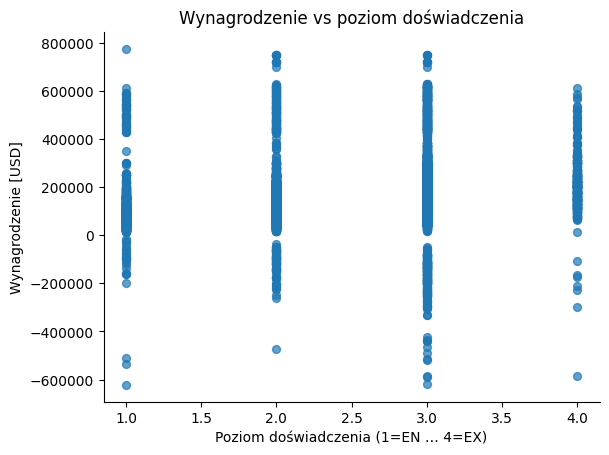

In [6]:
df_zepsuty.plot(
    kind="scatter",
    x="experience_level_num",
    y="salary_in_usd",
    s=32,
    alpha=0.7
)

plt.xlabel("Poziom doświadczenia (1=EN … 4=EX)")
plt.ylabel("Wynagrodzenie [USD]")
plt.title("Wynagrodzenie vs poziom doświadczenia")
plt.gca().spines[["top", "right"]].set_visible(False)
plt.show()


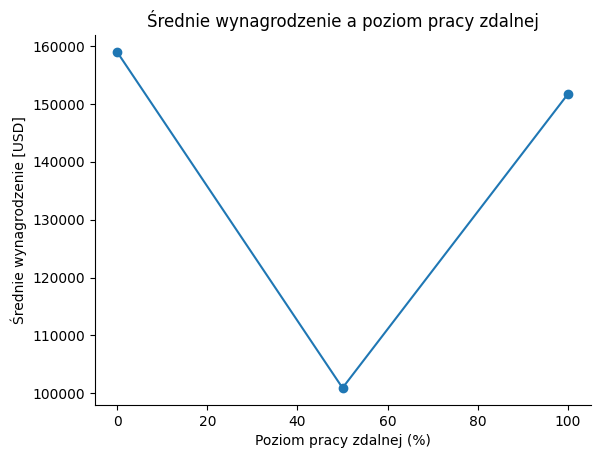

In [7]:
salary_by_remote = (
    df_zepsuty
    .groupby("remote_ratio")["salary_in_usd"]
    .mean()
    .sort_index()
)

salary_by_remote.plot(marker="o")

plt.xlabel("Poziom pracy zdalnej (%)")
plt.ylabel("Średnie wynagrodzenie [USD]")
plt.title("Średnie wynagrodzenie a poziom pracy zdalnej")
plt.gca().spines[["top", "right"]].set_visible(False)
plt.show()

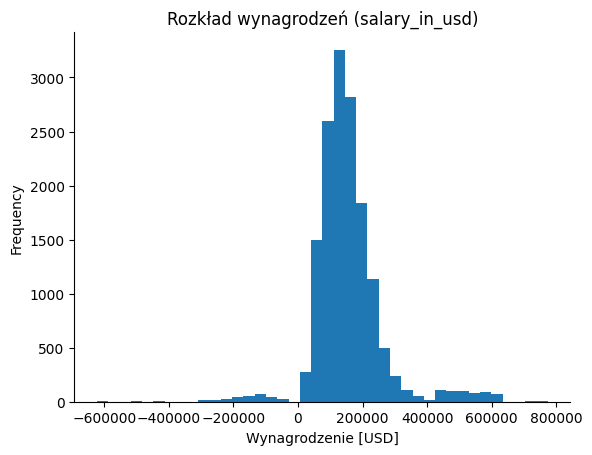

In [8]:
df_zepsuty["salary_in_usd"].plot(
    kind="hist",
    bins=40
)

plt.xlabel("Wynagrodzenie [USD]")
plt.title("Rozkład wynagrodzeń (salary_in_usd)")
plt.gca().spines[["top", "right"]].set_visible(False)
plt.show()

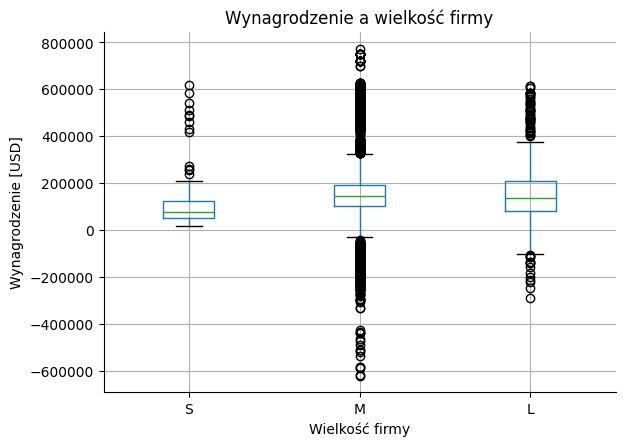

In [9]:
company_size_order = ["S", "M", "L"]
df_zepsuty["company_size"] = pd.Categorical(
    df_zepsuty["company_size"],
    categories=company_size_order,
    ordered=True
)

df_zepsuty.boxplot(
    column="salary_in_usd",
    by="company_size"
)

plt.xlabel("Wielkość firmy")
plt.ylabel("Wynagrodzenie [USD]")
plt.title("Wynagrodzenie a wielkość firmy")
plt.suptitle("")  # usuwa domyślny tytuł Pandas
plt.gca().spines[["top", "right"]].set_visible(False)
plt.show()

# 2. Naprawa datasetu

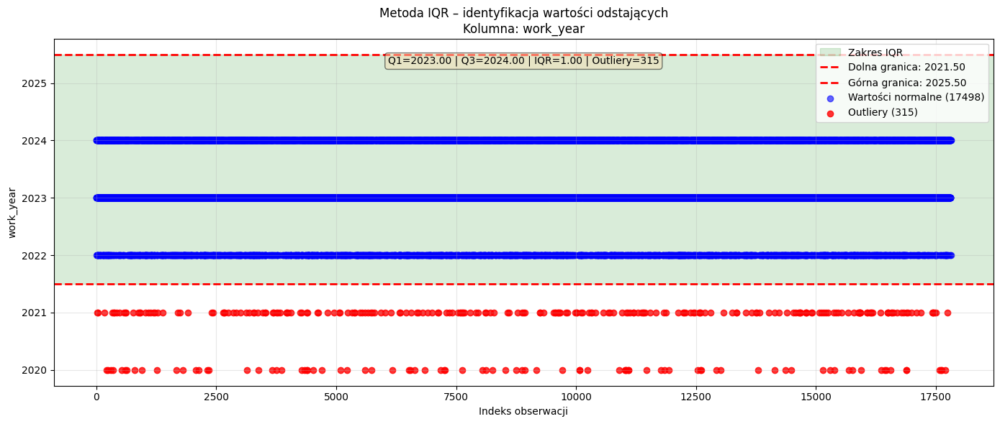

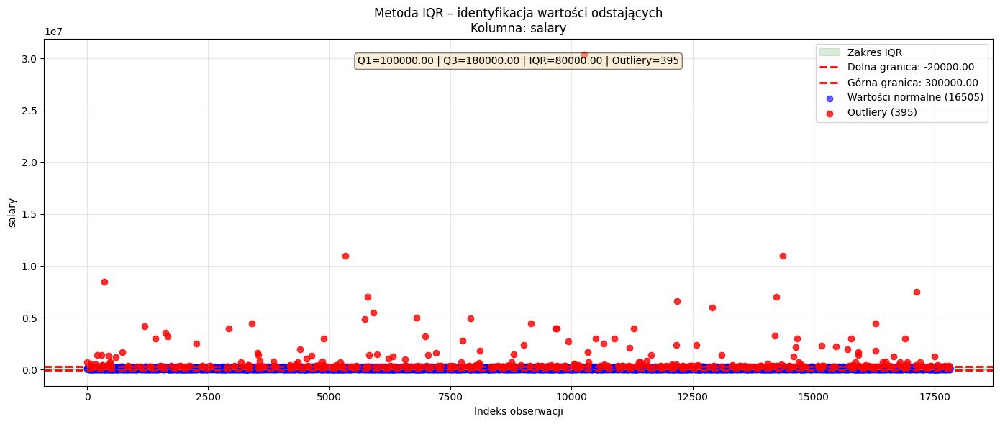

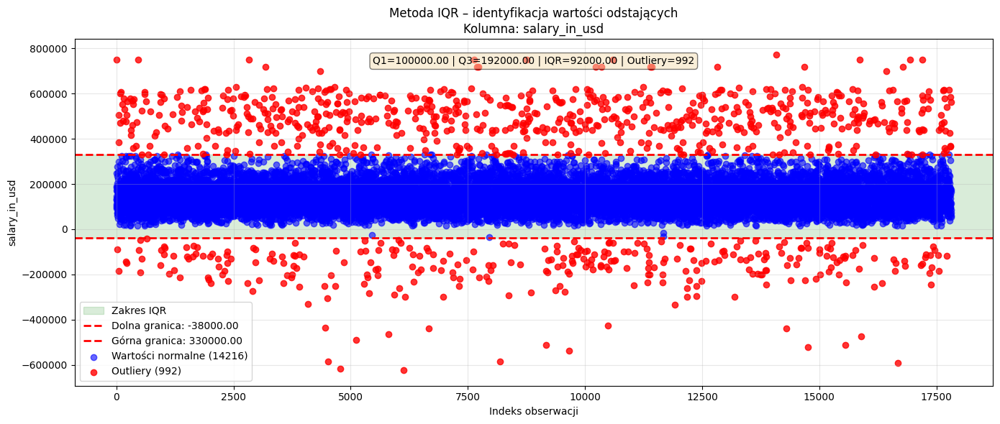

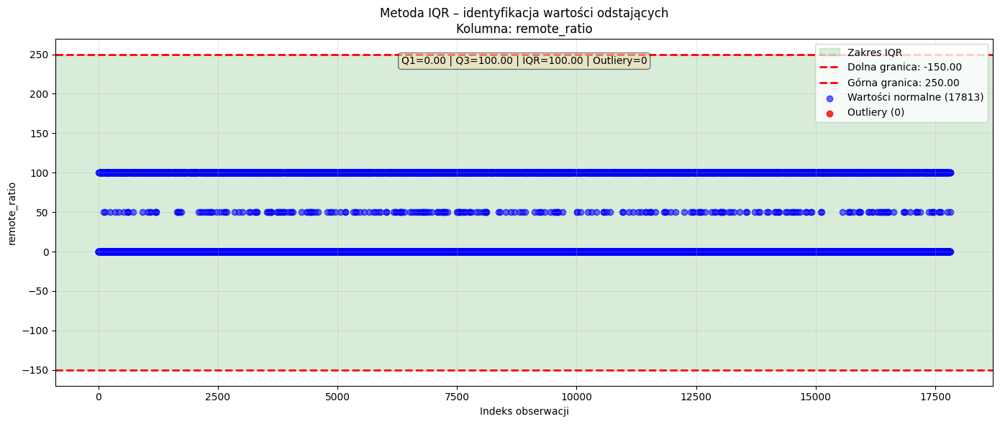

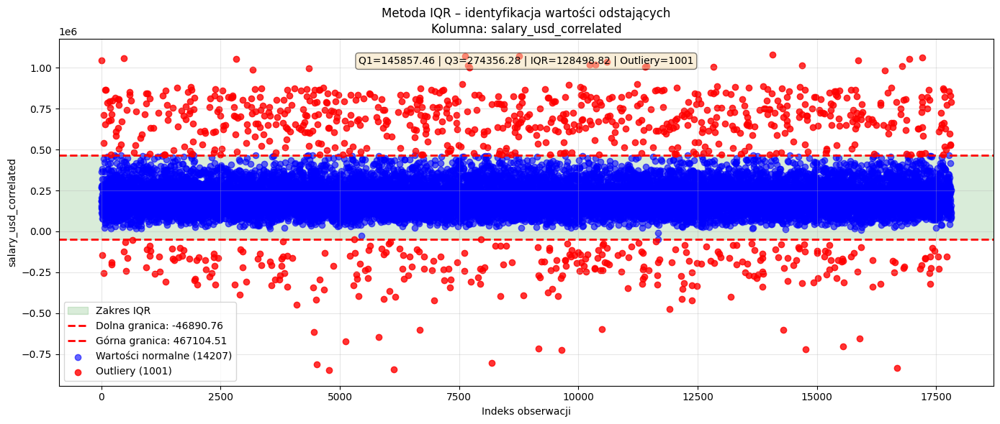

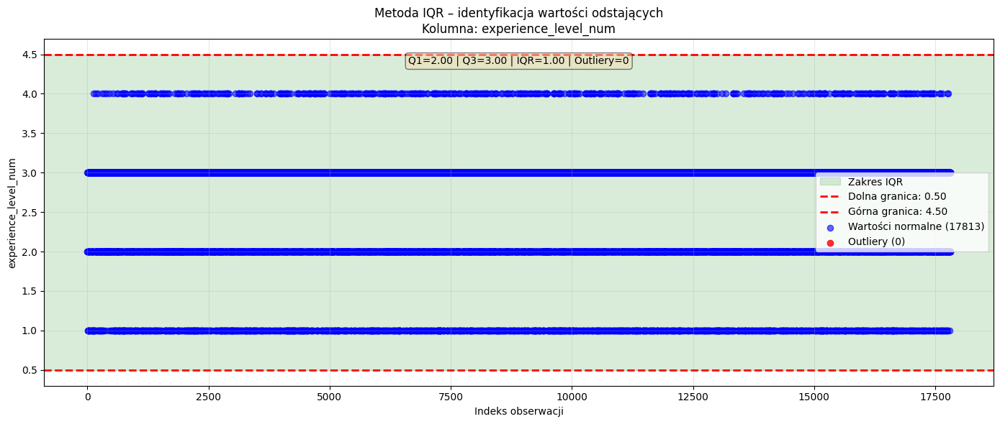

In [10]:
# kolumny numeryczne - wykrycie
numeric_cols = df_zepsuty.select_dtypes(include=[np.number]).columns

for col in numeric_cols:

    data = df_zepsuty[col].dropna()

    # pominięcie kolumn z mała iloscia danych jesli wystapia
    if len(data) < 10:
        print(f"Pominięto kolumnę {col} (za mało danych)")
        continue

    # kwartyle do IQR
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df_zepsuty[
        (df_zepsuty[col] < lower_bound) | (df_zepsuty[col] > upper_bound)
    ]
    normal = df_zepsuty[
        (df_zepsuty[col] >= lower_bound) & (df_zepsuty[col] <= upper_bound)
    ]

    plt.figure(figsize=(14, 6))

    # zakres IQR
    plt.axhspan(lower_bound, upper_bound, alpha=0.15, color="green", label="Zakres IQR")

    # granice
    plt.axhline(lower_bound, color="red", linestyle="--", linewidth=2,
                label=f"Dolna granica: {lower_bound:.2f}")
    plt.axhline(upper_bound, color="red", linestyle="--", linewidth=2,
                label=f"Górna granica: {upper_bound:.2f}")

    # punkty
    plt.scatter(
        normal.index, normal[col],
        c="blue", alpha=0.6,
        label=f"Wartości normalne ({len(normal)})"
    )
    plt.scatter(
        outliers.index, outliers[col],
        c="red", alpha=0.8,
        label=f"Outliery ({len(outliers)})"
    )

    plt.title(f"Metoda IQR – identyfikacja wartości odstających\nKolumna: {col}")
    plt.xlabel("Indeks obserwacji")
    plt.ylabel(col)
    plt.legend()
    plt.grid(alpha=0.3)

    info = (
        f"Q1={Q1:.2f} | Q3={Q3:.2f} | "
        f"IQR={IQR:.2f} | Outliery={len(outliers)}"
    )
    plt.text(
        0.5, 0.95, info,
        transform=plt.gca().transAxes,
        ha="center", va="top",
        bbox=dict(boxstyle="round", facecolor="wheat", alpha=0.5)
    )

    plt.tight_layout()
    plt.show()


In [11]:
# dopasowanie modelu Isolation Forest
isolation_forest = IsolationForest(contamination=0.05)
df_zepsuty["outliers"] = isolation_forest.fit_predict(df_zepsuty[["salary", "salary_in_usd"]])

# wyswietlenie wartosci odstajacych
df_zepsuty[df_zepsuty["outliers"] ==-1]

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_usd_correlated,experience_level_num,outliers
3,2023,MI,FT,Machine Learning Scientist,750000.0,USD,750000.000000,US,0,US,M,1.045248e+06,2,-1
23,2023,MI,FT,Data Scientist,90000.0,USD,-90000.000000,US,0,US,M,-1.466451e+05,2,-1
45,2023,SE,FT,Data Architect,185000.0,USD,-185000.000000,US,0,US,M,-2.554660e+05,3,-1
54,2023,SE,FT,Data Infrastructure Engineer,385000.0,USD,385000.000000,US,0,US,M,5.397200e+05,3,-1
70,2024,SE,FT,BI Developer,21600.0,USD,21600.000000,PH,0,PH,M,2.174984e+04,3,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17764,2023,EX,FT,Head of Data Science,330000.0,USD,330000.000000,US,0,US,M,4.634908e+05,4,-1
17773,2022,SE,FT,Data Scientist,245000.0,USD,618255.552419,US,0,US,M,8.563619e+05,3,-1
17782,2023,SE,FT,Data Engineer,310000.0,USD,425265.356740,US,0,US,M,5.954423e+05,3,-1
17795,2023,SE,FT,Data Scientist,305600.0,USD,305600.000000,US,0,US,M,4.168825e+05,3,-1


In [12]:
fig = px.scatter(df_zepsuty, x="salary", y="salary_in_usd", color="outliers", title="Wartosci odstajace w danych")
fig.show()

In [13]:
# pracujemy na kopii zestawu danych
df_to_clean = df_zepsuty.copy()
before = len(df_to_clean)
df_to_clean = df_to_clean.drop_duplicates()
after = len(df_to_clean)

print(f"Usunięto {before - after} zduplikowanych rekordów")

Usunięto 468 zduplikowanych rekordów


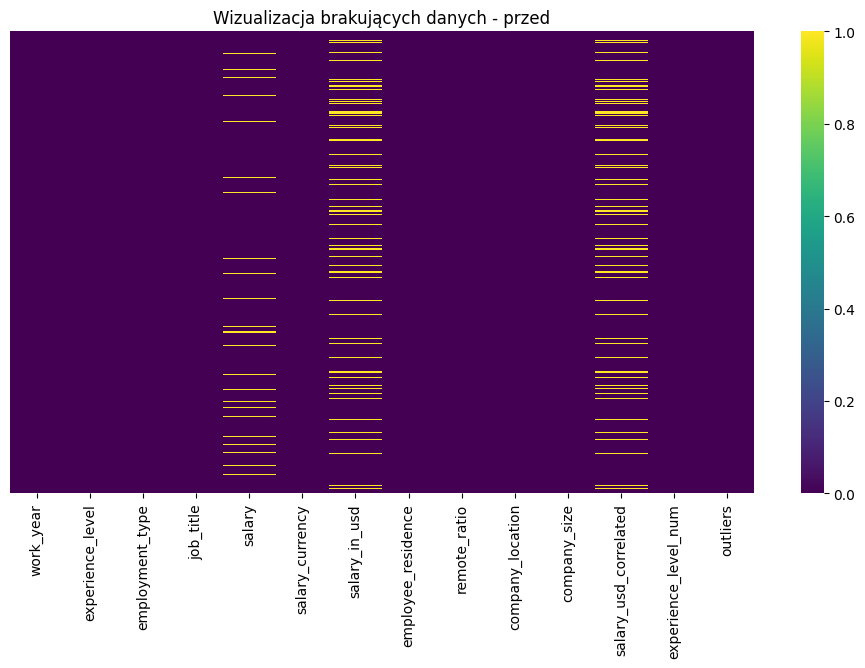

In [14]:
plt.figure(figsize=(12, 6))
sns.heatmap(
    df_to_clean.isnull(),
    cbar=True,
    yticklabels=False,
    cmap="viridis"
)
plt.title("Wizualizacja brakujących danych - przed")
plt.show()

In [15]:
numeric_columns = [
    "salary",
    "salary_in_usd",
    "remote_ratio",
    "salary_usd_correlated",
    "experience_level_num"
]

for col in numeric_columns:
    if col in df_to_clean.columns:
        df_to_clean[col] = pd.to_numeric(df_to_clean[col], errors="coerce")

In [16]:
before = len(df_to_clean)

df_to_clean = df_to_clean[
    (df_to_clean["salary_in_usd"] >= 0) &
    (df_to_clean["salary"] >= 0)
]

after = len(df_to_clean)
print(f"Usunięto {before - after} rekordów z ujemnymi wynagrodzeniami")

Usunięto 3339 rekordów z ujemnymi wynagrodzeniami


In [17]:
for col in numeric_columns:
    if col in df_to_clean.columns:
        missing = df_to_clean[col].isnull().sum()
        if missing > 0:
            median_value = df_to_clean[col].median()
            df_to_clean[col].fillna(median_value, inplace=True)
            print(f"Uzupełniono {missing} braków w {col} medianą")

In [18]:
categorical_columns = [
    "experience_level",
    "employment_type",
    "job_title",
    "employee_residence",
    "company_location",
    "company_size"
]

for col in categorical_columns:
    if col in df_to_clean.columns:
        missing = df_to_clean[col].isnull().sum()
        if missing > 0:
            mode_value = df_to_clean[col].mode()[0]
            df_to_clean[col].fillna(mode_value, inplace=True)
            print(f"Uzupełniono {missing} braków w {col} wartością '{mode_value}'")

Uzupełniono 1 braków w job_title wartością 'Data Engineer'


/tmp/ipython-input-1181763038.py:15: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





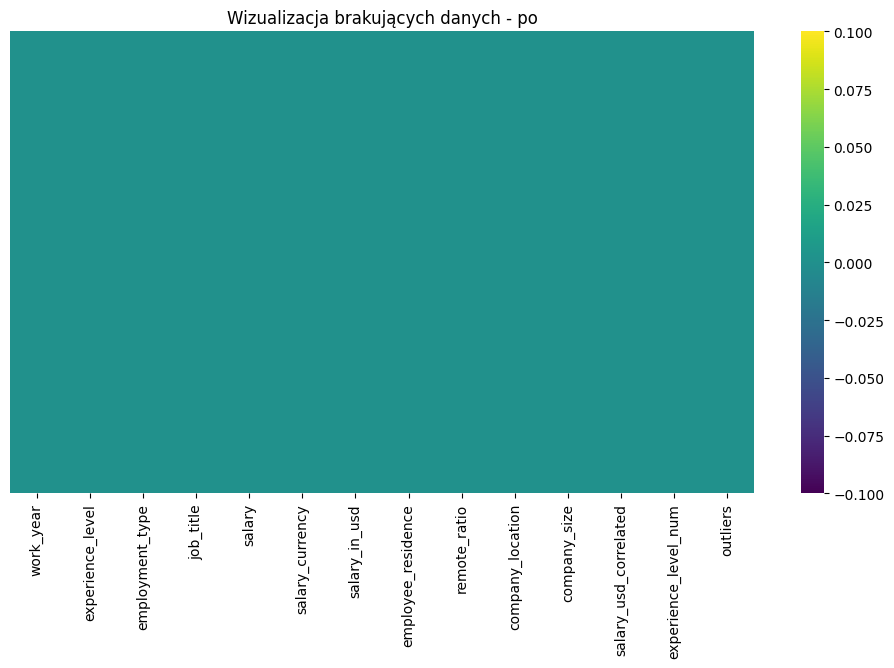

In [19]:
plt.figure(figsize=(12, 6))
sns.heatmap(
    df_to_clean.isnull(),
    cbar=True,
    yticklabels=False,
    cmap="viridis"
)
plt.title("Wizualizacja brakujących danych - po")
plt.show()

In [20]:
df_to_clean.info()
df_to_clean.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 14006 entries, 0 to 17812
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   work_year              14006 non-null  int64   
 1   experience_level       14006 non-null  object  
 2   employment_type        14006 non-null  object  
 3   job_title              14006 non-null  object  
 4   salary                 14006 non-null  float64 
 5   salary_currency        14006 non-null  object  
 6   salary_in_usd          14006 non-null  float64 
 7   employee_residence     14006 non-null  object  
 8   remote_ratio           14006 non-null  int64   
 9   company_location       14006 non-null  object  
 10  company_size           14006 non-null  category
 11  salary_usd_correlated  14006 non-null  float64 
 12  experience_level_num   14006 non-null  int64   
 13  outliers               14006 non-null  int64   
dtypes: category(1), float64(3), int64(4), objec

,0
work_year,0
experience_level,0
employment_type,0
job_title,0
salary,0
salary_currency,0
salary_in_usd,0
employee_residence,0
remote_ratio,0
company_location,0


In [21]:
df_to_clean = df_to_clean.reset_index(drop=True)
df_to_clean.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_usd_correlated,experience_level_num,outliers
0,2023,MI,FT,Machine Learning Engineer,145000.0,USD,145000.0,US,0,US,M,2.051345e+05,2,1
1,2023,MI,FT,Machine Learning Engineer,90000.0,EUR,97171.0,NL,100,NL,L,1.503259e+05,2,1
2,2023,MI,FT,Machine Learning Scientist,750000.0,USD,750000.0,US,0,US,M,1.045248e+06,2,-1
3,2023,SE,FT,Data Engineer,110000.0,USD,110000.0,US,0,US,M,1.412492e+05,3,1
4,2024,EN,FT,Data Analyst,93000.0,USD,93000.0,US,0,US,M,1.131036e+05,1,1


In [22]:
if "outliers" in df_to_clean.columns:
    df_to_clean = df_to_clean.drop(columns=["outliers"])

# 3. Wizualizacje i analizy

In [23]:
features_for_isolation = [
    "experience_level_num",
    "salary_in_usd"
]

X_isolation = df_to_clean[features_for_isolation].dropna()

In [24]:
isolation_forest = IsolationForest(
    contamination=0.006,
    random_state=42
)

outliers_pred = isolation_forest.fit_predict(X_isolation)

In [25]:
df_to_clean["outliers"] = 1
df_to_clean.loc[X_isolation.index, "outliers"] = outliers_pred

# podglad oulierow
df_to_clean[df_to_clean["outliers"] == -1]

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_usd_correlated,experience_level_num,outliers
2,2023,MI,FT,Machine Learning Scientist,750000.0,USD,750000.000000,US,0,US,M,1.045248e+06,2,-1
80,2023,MI,FT,BI Developer,154800.0,USD,606770.608316,US,0,US,M,8.661285e+05,2,-1
454,2024,MI,FT,Data Analyst,150000.0,USD,596537.218676,US,100,US,M,8.329441e+05,2,-1
455,2024,MI,FT,Data Scientist,44263.0,GBP,606549.200103,ZA,0,ZA,M,8.502767e+05,2,-1
1011,2023,EN,FT,Data Engineer,62000.0,USD,584973.967447,US,100,US,M,8.284265e+05,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12952,2021,EN,FT,Research Scientist,100000.0,USD,613344.775516,JE,0,CN,L,8.480115e+05,1,-1
13204,2024,EN,FT,Data Analyst,83300.0,USD,567128.730392,US,0,US,M,8.026225e+05,1,-1
13518,2023,MI,FT,Data Engineer,750000.0,USD,750000.000000,US,0,US,M,1.063227e+06,2,-1
13885,2024,MI,FT,Research Engineer,100000.0,USD,615396.989792,US,0,US,M,8.648583e+05,2,-1


In [26]:
fig = px.scatter(
    df_to_clean,
    x="experience_level_num",
    y="salary_in_usd",
    color="outliers",
    color_discrete_map={1: "blue", -1: "red"},
    title="Wartości odstające w danych – Isolation Forest",
    labels={
        "outliers": "Typ obserwacji",
        "experience_level_num": "Poziom doświadczenia (1=EN … 4=EX)",
        "salary_in_usd": "Wynagrodzenie [USD]"
    }
)

fig.update_traces(
    marker=dict(
        size=8,
        line=dict(width=1, color="DarkSlateGrey")
    )
)

fig.show()

In [28]:
# Analiza głównych składowych (PCA) i redukcja wymiarowości
df_to_clean = df_to_clean.drop(columns=["outliers"], errors="ignore")

pca_features = [
    "experience_level_num",
    "remote_ratio",
    "salary_in_usd"
]

X_pca = df_to_clean[pca_features].dropna()

# standaryzacja PCA
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X_pca)

pca = PCA(n_components=2, random_state=42)
principal_components = pca.fit_transform(scaled_data)

In [29]:
# dodanie komponentow do df
df_to_clean["PC1"] = np.nan
df_to_clean["PC2"] = np.nan

df_to_clean.loc[X_pca.index, "PC1"] = principal_components[:, 0]
df_to_clean.loc[X_pca.index, "PC2"] = principal_components[:, 1]

pca.explained_variance_ratio_

array([0.41130709, 0.33717091])

In [30]:
# wizualizacja pca
fig = px.scatter(
    df_to_clean.dropna(subset=["PC1", "PC2"]),
    x="PC1",
    y="PC2",
    color="experience_level_num",
    title="PCA – wizualizacja głównych składowych",
    color_continuous_scale="Viridis",
    labels={
        "experience_level_num": "Poziom doświadczenia (1=EN … 4=EX)"
    }
)

fig.update_traces(marker=dict(size=7))
fig.show()

In [36]:
# t-sne
tsne_features = ["experience_level_num",
    "remote_ratio",
    "salary_in_usd"
]

df_to_clean[tsne_features].corr()

,experience_level_num,remote_ratio,salary_in_usd
experience_level_num,1.000000,0.033924,0.23379
remote_ratio,0.033924,1.000000,-0.04167
salary_in_usd,0.233790,-0.041670,1.00000


In [37]:
# stsndaryzacja t-sne
X_tsne = df_to_clean[tsne_features].dropna()

scaler = StandardScaler()
scaled_data = scaler.fit_transform(X_tsne)

tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=2000, learning_rate=200)
tsne_results = tsne.fit_transform(scaled_data)

df_to_clean['tSNE1'] = np.nan
df_to_clean['tSNE2'] = np.nan
df_to_clean.loc[X_tsne.index, 'tSNE1'] = tsne_results[:, 0]
df_to_clean.loc[X_tsne.index, 'tSNE2'] = tsne_results[:, 1]

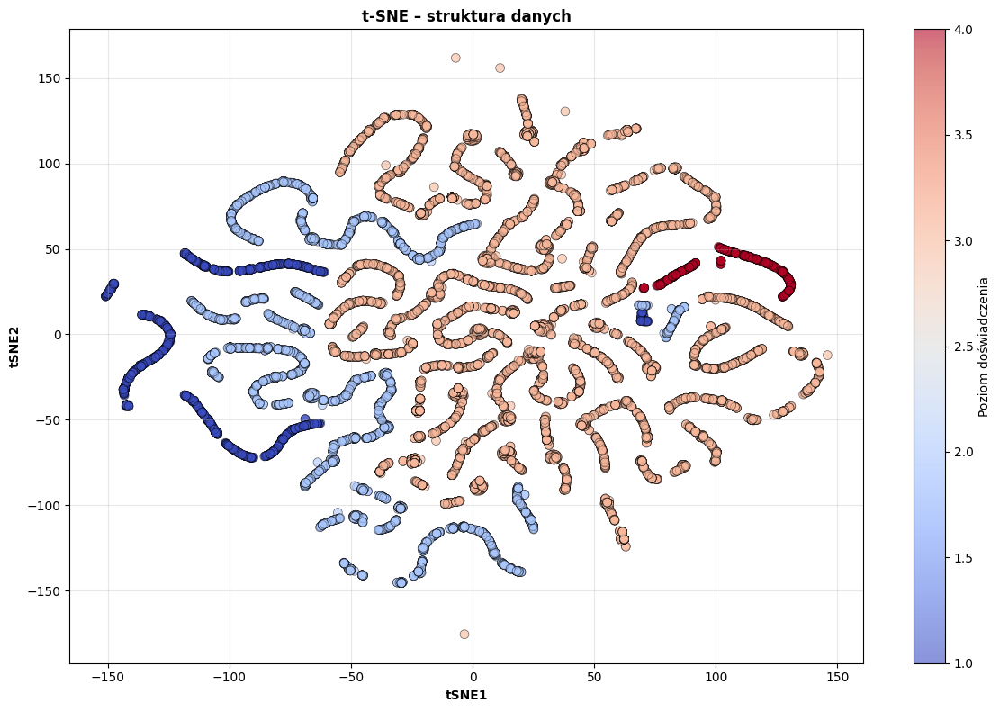

In [38]:
# wizualizacja t-sne
df_tsne_plot = df_to_clean.dropna(subset=["tSNE1", "tSNE2"])

plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    df_tsne_plot["tSNE1"],
    df_tsne_plot["tSNE2"],
    c=df_tsne_plot["experience_level_num"],
    cmap="coolwarm",
    s=50,
    alpha=0.6,
    edgecolors="black",
    linewidth=0.5
)

plt.colorbar(scatter, label="Poziom doświadczenia")
plt.xlabel("tSNE1", fontweight="bold")
plt.ylabel("tSNE2", fontweight="bold")
plt.title("t-SNE – struktura danych", fontweight="bold")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [39]:
# umap
umap_features = [
    "experience_level_num",
    "salary_in_usd"
]

X_umap = df_to_clean[umap_features].dropna()

In [42]:
# standaryzacja umap
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X_umap)

reducer = umap.UMAP(
    n_neighbors=10,
    min_dist=0.1,
    random_state=42
)

umap_results = reducer.fit_transform(scaled_data)

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.12/dist-packages/umap/spectral.py:548: UserWarning:

Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

/usr/local/lib/python3.12/dist-packages/umap/spectral.py:548: UserWarning:

Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

/usr/local/lib/python3.12/dist-packages/umap/spectral.py:548: UserWarning:

Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

/usr/local/l

In [43]:
df_to_clean["UMAP1"] = np.nan
df_to_clean["UMAP2"] = np.nan

df_to_clean.loc[X_umap.index, "UMAP1"] = umap_results[:, 0]
df_to_clean.loc[X_umap.index, "UMAP2"] = umap_results[:, 1]

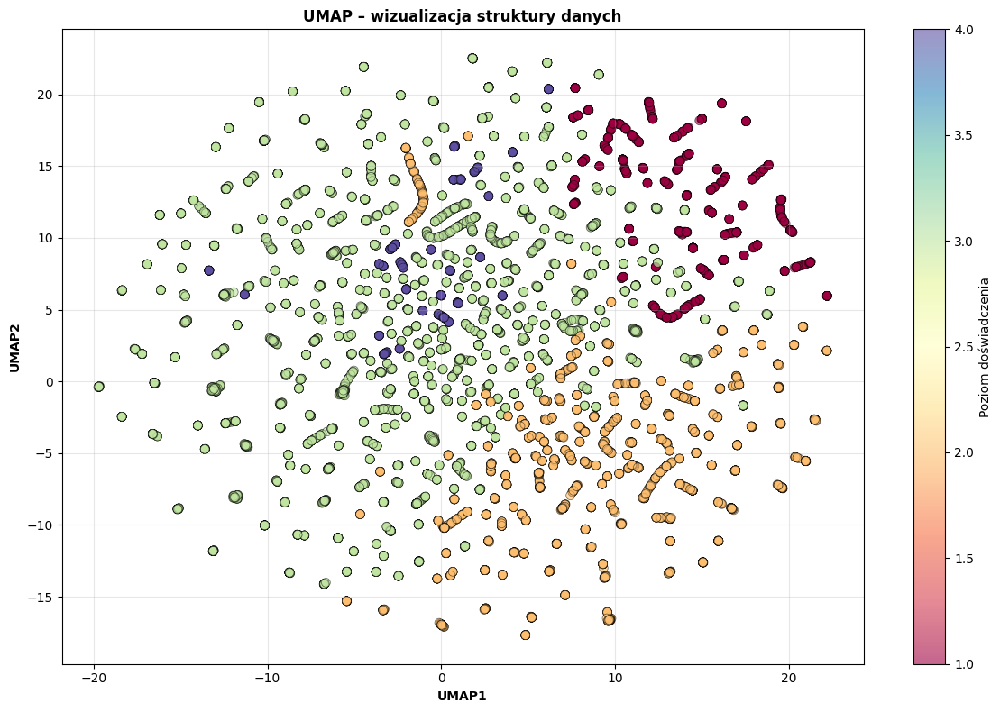

In [44]:
df_umap_plot = df_to_clean.dropna(subset=["UMAP1", "UMAP2"])

plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    df_umap_plot["UMAP1"],
    df_umap_plot["UMAP2"],
    c=df_umap_plot["experience_level_num"],
    cmap="Spectral",
    s=50,
    alpha=0.6,
    edgecolors="black",
    linewidth=0.5
)

plt.colorbar(scatter, label="Poziom doświadczenia")
plt.xlabel("UMAP1", fontweight="bold")
plt.ylabel("UMAP2", fontweight="bold")
plt.title("UMAP – wizualizacja struktury danych", fontweight="bold")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [45]:
# interaktywna analiza zależności
import altair as alt

alt.data_transformers.disable_max_rows()

df_altair = (
    df_to_clean
    .dropna(subset=[
        "experience_level_num",
        "salary_in_usd",
        "remote_ratio"
    ])
    .copy()
)

In [46]:
chart = alt.Chart(df_altair).mark_circle(size=80, opacity=0.75).encode(
    x=alt.X(
        "experience_level_num:Q",
        title="Poziom doświadczenia (1=EN … 4=EX)",
        scale=alt.Scale(domain=[0.5, 4.5])
    ),
    y=alt.Y(
        "salary_in_usd:Q",
        title="Wynagrodzenie [USD]",
        scale=alt.Scale(type="log")  # bardzo ważne przy outlierach
    ),
    color=alt.Color(
        "remote_ratio:Q",
        scale=alt.Scale(scheme="viridis"),
        title="Praca zdalna (%)"
    ),
    tooltip=[
        alt.Tooltip("job_title:N", title="Stanowisko"),
        alt.Tooltip("experience_level:N", title="Poziom"),
        alt.Tooltip("salary_in_usd:Q", title="Salary USD", format=",.0f"),
        alt.Tooltip("remote_ratio:Q", title="Remote (%)"),
        alt.Tooltip("company_size:N", title="Firma")
    ]
).properties(
    width=750,
    height=500,
    title="Interaktywna analiza: doświadczenie, wynagrodzenie i praca zdalna"
).interactive()

chart

alt.Chart(...)

In [47]:
# analiza macierzy korelacji
correlation_features = [
    "experience_level_num",
    "salary_in_usd",
    "remote_ratio"
]

df_corr = df_to_clean[correlation_features].dropna()
correlation_matrix = df_corr.corr()

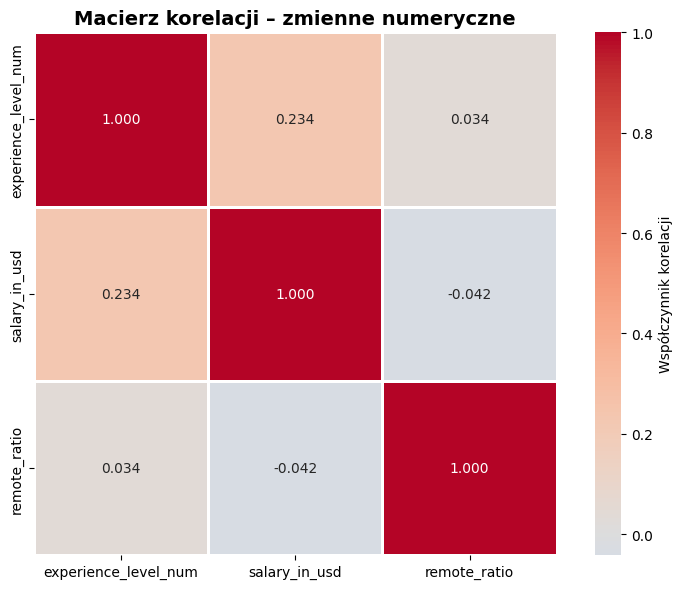

In [48]:
plt.figure(figsize=(8, 6))

sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".3f",
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"label": "Współczynnik korelacji"}
)

plt.title("Macierz korelacji – zmienne numeryczne", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# Testy statystyczne - ANOVA

In [49]:
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [50]:
df_anova = (
    df_to_clean
    .dropna(subset=["salary_in_usd", "experience_level"])
    .copy()
)

# model anova
model = ols(
    'salary_in_usd ~ C(experience_level)',
    data=df_anova
).fit()

anova_results = anova_lm(model)
anova_results

# statystyki testowe
f_statistic = anova_results.loc['C(experience_level)', 'F']
p_value = anova_results.loc['C(experience_level)', 'PR(>F)']

interpretation = (
    "Różnice ISTOTNE statystycznie (p < 0.05)"
    if p_value < 0.05
    else "Brak istotnych różnic (p ≥ 0.05)"
)

/tmp/ipython-input-3555131618.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




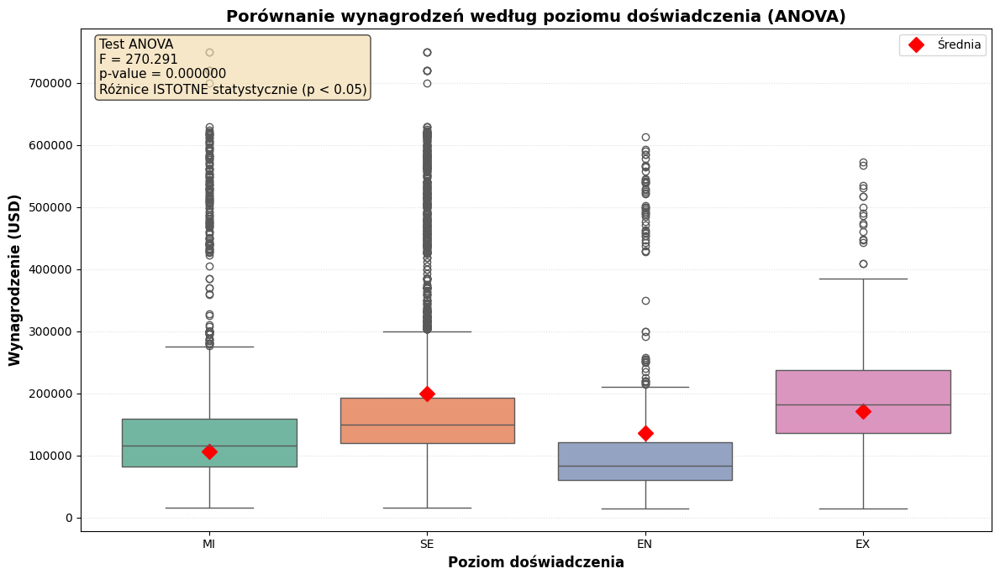

In [52]:
# wizualizacja
plt.figure(figsize=(12, 7))

ax = sns.boxplot(
    data=df_anova,
    x="experience_level",
    y="salary_in_usd",
    palette="Set2",
    showfliers=True
)

means = df_anova.groupby("experience_level")["salary_in_usd"].mean()

ax.plot(
    range(len(means)),
    means.values,
    marker="D",
    color="red",
    linestyle="",
    markersize=9,
    label="Średnia"
)

ax.set_xlabel("Poziom doświadczenia", fontsize=12, fontweight="bold")
ax.set_ylabel("Wynagrodzenie (USD)", fontsize=12, fontweight="bold")
ax.set_title(
    "Porównanie wynagrodzeń według poziomu doświadczenia (ANOVA)",
    fontsize=14,
    fontweight="bold"
)

textstr = (
    f"Test ANOVA\n"
    f"F = {f_statistic:.3f}\n"
    f"p-value = {p_value:.6f}\n"
    f"{interpretation}"
)

props = dict(boxstyle="round", facecolor="wheat", alpha=0.7)
ax.text(
    0.02, 0.98,
    textstr,
    transform=ax.transAxes,
    fontsize=11,
    verticalalignment="top",
    bbox=props
)

ax.legend()
ax.grid(True, axis="y", linestyle=":", alpha=0.4)

plt.tight_layout()
plt.show()